<center><img src="machine-learning.png"></center>

<h1 style="color:#cc4e00; text-align: center">Universidad Castro Carazo</h1>
<h4 style="color:#ff8030; text-align: center">3C -2024 Machine Learning </h4> 
</br>
<p style="text-align: justify; font-family: Times New Roman">El machine learning es un subconjunto de la inteligencia artificial (IA). Se enfoca en enseñar a las computadoras para que aprendan de los datos y mejoren con la experiencia en lugar de ser explícitamente programadas para hacerlo.</p>

<h4 style="color:#ffdd8c "> Importando librerias</h4
                                                    

In [40]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

from ydata_profiling import ProfileReport

from scipy.stats import zscore
import seaborn as sns 
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module='seaborn')

from sklearn import linear_model
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

%matplotlib inline

<h4 style="color:#ffdd8c "> Cargamos el dataset</h4>

In [41]:
dfSong = pd.read_csv("song_data.csv", sep= ",", encoding= "utf-8", on_bad_lines="skip", low_memory=False)
dfSong

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,Boulevard of Broken Dreams,73,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474
1,In The End,66,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370
2,Seven Nation Army,76,231733,0.008170,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.324
3,By The Way,74,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.198
4,How You Remind Me,56,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18830,Let It Breathe,60,159645,0.893000,0.500,0.151,0.000065,11,0.1110,-16.107,1,0.0348,113.969,4,0.300
18831,Answers,60,205666,0.765000,0.495,0.161,0.000001,11,0.1050,-14.078,0,0.0301,94.286,4,0.265
18832,Sudden Love (Acoustic),23,182211,0.847000,0.719,0.325,0.000000,0,0.1250,-12.222,1,0.0355,130.534,4,0.286
18833,Gentle on My Mind,55,352280,0.945000,0.488,0.326,0.015700,3,0.1190,-12.020,1,0.0328,106.063,4,0.323


<h4 style="color:#ffdd8c "> Aplicamos Ydata profiling</h4>

In [42]:
profile = ProfileReport(dfSong, title='EDA_Song')
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<h4 style="color:#ffdd8c "> Eliminamos valores duplicados</h4>

In [43]:
dfSong.drop_duplicates(subset=None, keep='first', inplace=True, ignore_index=True)
dfSong.shape

(14926, 15)

In [44]:
dfSong.describe()

,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
count,14926.000000,1.492600e+04,14926.000000,14926.000000,14926.000000,14926.000000,14926.000000,14926.000000,14926.000000,14926.000000,14926.000000,14926.000000,14926.000000,14926.000000
mean,48.750904,2.189496e+05,0.270453,0.624514,0.639763,0.092067,5.301152,0.180435,-7.677232,0.631917,0.099419,121.105007,3.952968,0.526967
std,20.379465,6.234080e+04,0.298117,0.158081,0.221756,0.240451,3.592616,0.145097,4.018670,0.482300,0.103546,29.044644,0.316702,0.247758
min,0.000000,1.200000e+04,0.000001,0.000000,0.001070,0.000000,0.000000,0.010900,-38.768000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,37.000000,1.839435e+05,0.023600,0.524000,0.496000,0.000000,2.000000,0.093000,-9.389500,0.000000,0.037200,98.125000,4.000000,0.332000
50%,52.000000,2.118455e+05,0.139000,0.636000,0.672000,0.000021,5.000000,0.122000,-6.750500,1.000000,0.054100,120.016000,4.000000,0.527000
75%,63.750000,2.447200e+05,0.458000,0.740000,0.818000,0.005105,8.000000,0.224000,-4.991000,1.000000,0.113000,139.940750,4.000000,0.727750
max,100.000000,1.799346e+06,0.996000,0.987000,0.999000,0.997000,11.000000,0.986000,1.585000,1.000000,0.941000,242.318000,5.000000,0.984000


<h4 style="color:#ffdd8c "> Visualizamos las variables</h4>

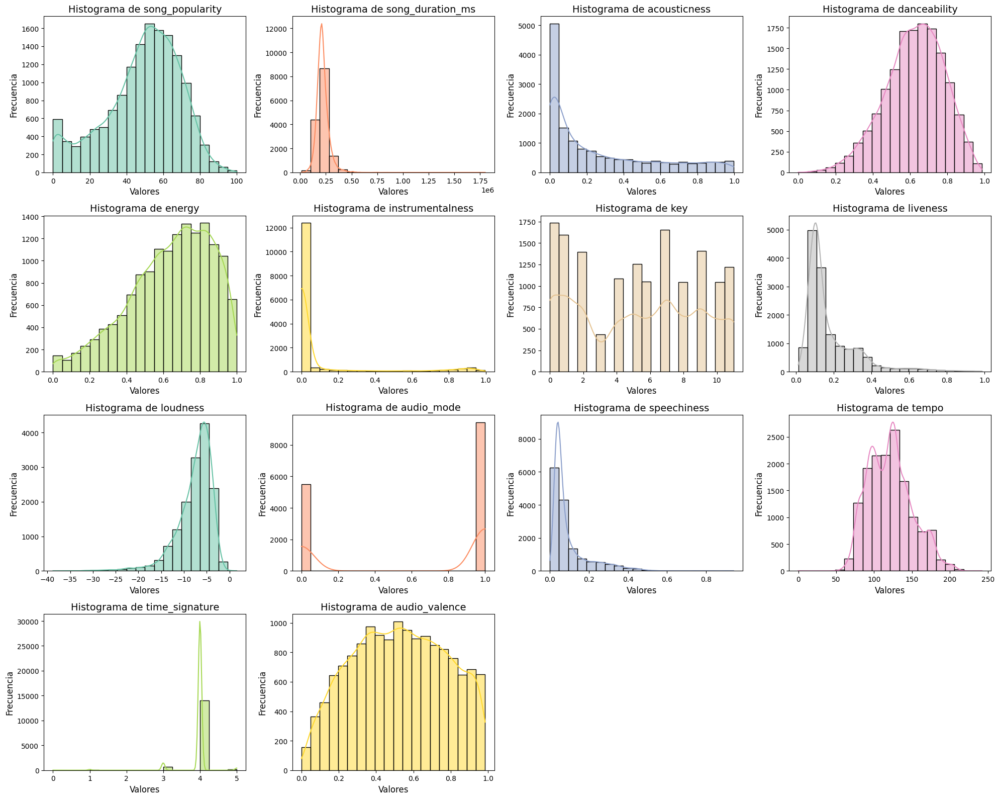

In [45]:
dfNumerico = dfSong.select_dtypes(include='number')


num_vars = len(dfNumerico.columns)
cols = 4
rows = (num_vars // cols) + (num_vars % cols > 0)

plt.figure(figsize=(20, rows * 4))


paleta = sns.color_palette("Set2", num_vars)


for i, columna in enumerate(dfNumerico.columns, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(dfNumerico[columna].dropna(), kde=True, color=paleta[i-1], bins=20)
    plt.title(f'Histograma de {columna}', fontsize=14)
    plt.xlabel('Valores', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)


plt.tight_layout()
plt.show()

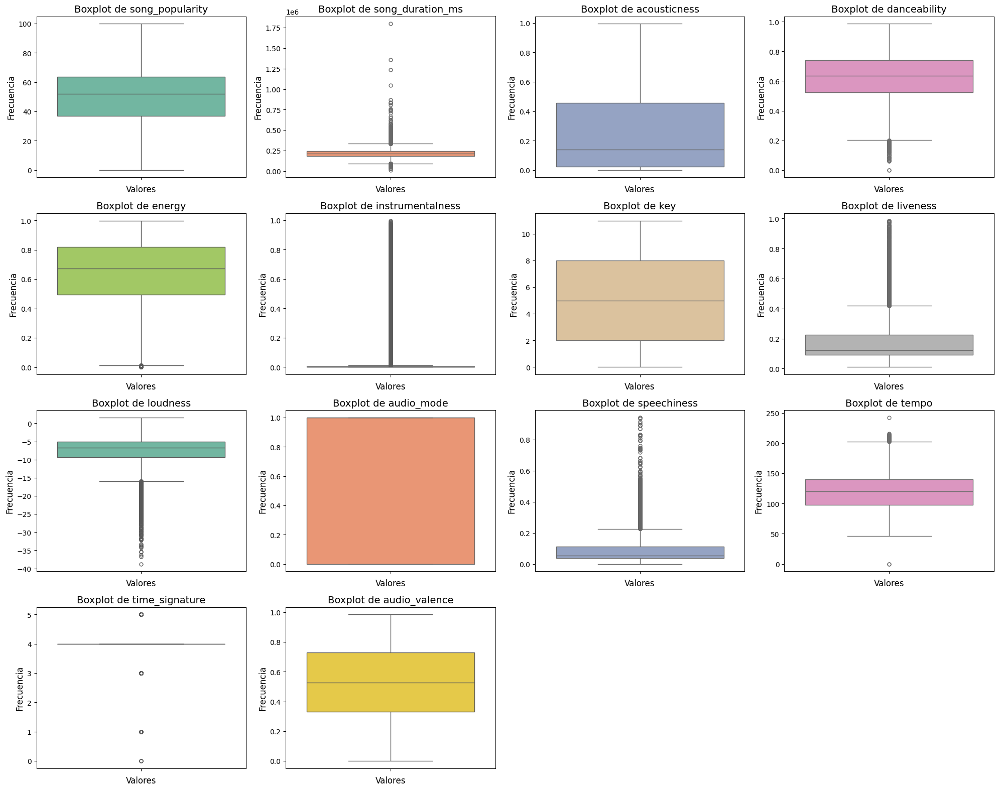

In [46]:
dfNumerico = dfSong.select_dtypes(include='number')


num_vars = len(dfNumerico.columns)
cols = 4
rows = (num_vars // cols) + (num_vars % cols > 0)

plt.figure(figsize=(20, rows * 4))


paleta = sns.color_palette("Set2", num_vars)


for i, columna in enumerate(dfNumerico.columns, 1):
    plt.subplot(rows, cols, i)
    sns.boxplot(y=dfNumerico[columna], color=paleta[i-1], fliersize=5)
    plt.title(f'Boxplot de {columna}', fontsize=14)
    plt.xlabel('Valores', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)


plt.tight_layout()
plt.show()

<h4 style="color:#ffdd8c "> Rango Inter Cuartil (IQR)</h4>

<h5 style="color:#fdca49 "> Outliers</h5>

In [47]:
seventy_fifth = dfSong['song_duration_ms'].quantile(0.75)
twenty_fifth = dfSong['song_duration_ms'].quantile(0.25)

iqr =seventy_fifth - twenty_fifth

upper = seventy_fifth + (1.5 * iqr)
lower = twenty_fifth - (1.5 * iqr)

outlier_songduration = dfSong[(dfSong['song_duration_ms'] < lower) | (dfSong['song_duration_ms'] > upper)]
outlier_songduration

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
125,Live Your Life (feat. Rihanna),76,338853,0.071000,0.375,0.862,0.000000,11,0.2110,-3.363,0,0.2550,159.841,4,0.4780
216,Pedro Navaja,60,443480,0.779000,0.582,0.610,0.000007,11,0.2670,-6.641,0,0.1030,93.658,4,0.8260
225,Corazón partio,74,343413,0.199000,0.648,0.846,0.000004,0,0.0803,-6.731,1,0.0424,160.075,4,0.8150
228,Rebelión,43,378373,0.112000,0.559,0.730,0.002670,10,0.2630,-8.461,0,0.0639,106.806,4,0.7780
229,La Maza,58,351400,0.652000,0.555,0.331,0.000012,9,0.2350,-17.718,0,0.2700,170.603,3,0.4370
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14560,Nothing To Find,56,370013,0.000034,0.326,0.916,0.132000,0,0.2740,-4.933,1,0.0514,157.993,4,0.6280
14770,Aqueous Transmission,55,466560,0.005010,0.415,0.456,0.763000,9,0.1780,-12.082,1,0.0352,151.937,4,0.0935
14791,"Lover, You Should've Come Over",57,403186,0.385000,0.388,0.609,0.000004,2,0.1380,-6.087,1,0.0402,120.005,3,0.1720
14807,Underwater,62,349319,0.016100,0.609,0.816,0.015600,6,0.1140,-6.528,0,0.0340,118.007,4,0.4220


<h5 style="color:#fdca49 "> Inliers</h5>

In [48]:
inlier_songduration = dfSong[(dfSong['song_duration_ms'] >= lower) & (dfSong['song_duration_ms'] <= upper)]
inlier_songduration

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,Boulevard of Broken Dreams,73,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474
1,In The End,66,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370
2,Seven Nation Army,76,231733,0.008170,0.737,0.463,0.447000,0,0.2550,-7.828,1,0.0792,123.881,4,0.324
3,By The Way,74,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.198
4,How You Remind Me,56,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14920,I Know,62,195106,0.395000,0.644,0.523,0.000000,4,0.0930,-7.660,1,0.0378,95.966,4,0.445
14921,Let It Breathe,60,159645,0.893000,0.500,0.151,0.000065,11,0.1110,-16.107,1,0.0348,113.969,4,0.300
14922,Answers,60,205666,0.765000,0.495,0.161,0.000001,11,0.1050,-14.078,0,0.0301,94.286,4,0.265
14923,Sudden Love (Acoustic),23,182211,0.847000,0.719,0.325,0.000000,0,0.1250,-12.222,1,0.0355,130.534,4,0.286


In [49]:
dfSong = inlier_songduration

<h4 style="color:#ffdd8c "> Se retiran el resto de outliers y filtramos los valores</h4>

In [50]:
def OutlierIQR(df, column):
    # Calcular Q25 y Q75
    seventy_fifth = df[column].quantile(0.75)
    twenty_fifth = df[column].quantile(0.25)
    # Calcular el IQR
    iqr = seventy_fifth - twenty_fifth
    # Calcular los límites (superior e inferior)
    upper = seventy_fifth + (1.5 * iqr)
    lower = twenty_fifth - (1.5 * iqr)
    # Filtrar los outliers
    filtered_df = df[(df[column] >= lower) & (df[column] <= upper)]
    return filtered_df
 
dfSong = OutlierIQR(dfSong, 'danceability')
dfSong = OutlierIQR(dfSong, 'instrumentalness')
dfSong = OutlierIQR(dfSong, 'liveness')
dfSong = OutlierIQR(dfSong, 'loudness')
dfSong = OutlierIQR(dfSong, 'speechiness')
dfSong = OutlierIQR(dfSong, 'tempo')
dfSong = OutlierIQR(dfSong, 'time_signature')

<h4 style="color:#ffdd8c "> Visualizacion de actualizacion del data frame con valores filtrados</h4>

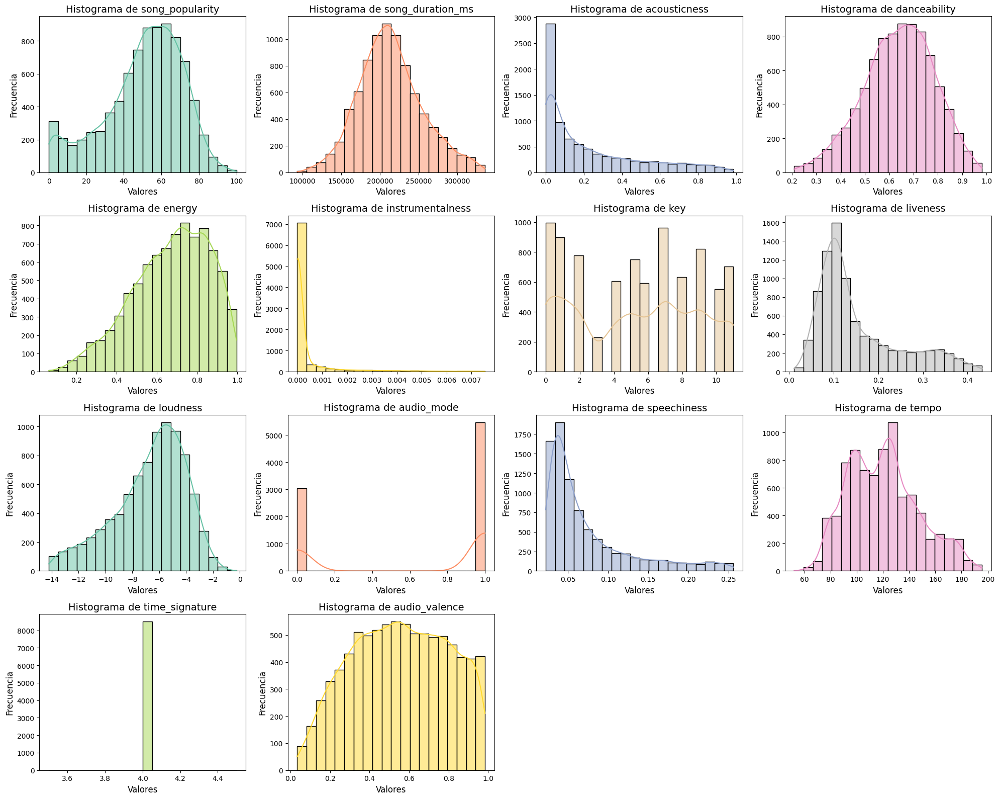

In [51]:
dfNumerico = dfSong.select_dtypes(include='number')


num_vars = len(dfNumerico.columns)
cols = 4
rows = (num_vars // cols) + (num_vars % cols > 0)

plt.figure(figsize=(20, rows * 4))


paleta = sns.color_palette("Set2", num_vars)


for i, columna in enumerate(dfNumerico.columns, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(dfNumerico[columna].dropna(), kde=True, color=paleta[i-1], bins=20)
    plt.title(f'Histograma de {columna}', fontsize=14)
    plt.xlabel('Valores', fontsize=12)
    plt.ylabel('Frecuencia', fontsize=12)


plt.tight_layout()
plt.show()

In [52]:
dfSong.shape

(8510, 15)

<h4 style="color:#ffdd8c "> Valores faltantes</h4

In [53]:
dfNull = dfSong.isnull()
dfNull.shape

(8510, 15)

In [54]:
dfNull

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence
0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
5,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14919,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14920,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14922,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
14923,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


<h4 style="color:#ffdd8c "> PCA</h4

<h5 style="color:#fdca49 "> Columna de caracteriscas importantes</h5>

In [55]:
dfSong.columns

Index(['song_name', 'song_popularity', 'song_duration_ms', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature',
       'audio_valence'],
      dtype='object')

In [56]:
dfcan = dfSong.groupby('song_name')[['song_popularity', 'song_duration_ms', 'danceability', 'energy', 'liveness']].sum()

In [57]:
dfcan['predecir exito de la cancion_Y'] = dfcan.sum(axis=1)

In [58]:
dfSong = dfSong.merge(dfcan[['predecir exito de la cancion_Y']], on='song_name', how='left')

In [59]:
dfSong.head(5)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,predecir exito de la cancion_Y
0,Boulevard of Broken Dreams,73,262333,0.005520,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474,523745.4442
1,In The End,66,216933,0.010300,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370,217000.5030
2,By The Way,74,216933,0.026400,0.451,0.970,0.003550,0,0.1020,-4.938,1,0.1070,122.444,4,0.198,217008.5230
3,How You Remind Me,56,223826,0.000954,0.447,0.766,0.000000,10,0.1130,-5.065,1,0.0313,172.011,4,0.574,447803.6350
4,Bring Me To Life,80,235893,0.008950,0.316,0.945,0.000002,4,0.3960,-3.169,0,0.1240,189.931,4,0.320,235974.6570


In [60]:
dfSong = dfSong.rename(columns={'predecir exito de la cancion_Y' : 'Y'})
dfSong.head(2)

,song_name,song_popularity,song_duration_ms,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,audio_mode,speechiness,tempo,time_signature,audio_valence,Y
0,Boulevard of Broken Dreams,73,262333,0.00552,0.496,0.682,0.000029,8,0.0589,-4.095,1,0.0294,167.060,4,0.474,523745.4442
1,In The End,66,216933,0.01030,0.542,0.853,0.000000,3,0.1080,-6.407,0,0.0498,105.256,4,0.370,217000.5030


In [61]:
features = ['song_popularity', 'song_duration_ms', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'key', 'liveness',
       'loudness', 'audio_mode', 'speechiness', 'tempo', 'time_signature',
       'audio_valence', 'Y']  
 
x = dfSong.loc[:, features].values  
y = dfSong.loc[:, ['Y']].values  
 
x = StandardScaler().fit_transform(x)  
print(x)

[[ 1.08682507  1.1667768  -0.88412535 ...  0.         -0.34275579
   1.5277    ]
 [ 0.74896639  0.07174636 -0.86577071 ...  0.         -0.77627344
  -0.39206935]
 [ 1.13509059  0.07174636 -0.80394862 ...  0.         -1.49324494
  -0.39201916]
 ...
 [ 0.45937324 -0.20000932  2.03218775 ...  0.         -1.21395953
  -0.46262629]
 [-1.32645121 -0.76573485  2.34705802 ...  0.         -1.12642231
  -0.60964889]
 [ 0.45937324 -0.49265259  2.59281043 ...  0.          0.10326717
  -0.53855864]]


In [62]:
pca =PCA(n_components=2)
principalComponents = pca.fit_transform(x)
dfPCA = pd.DataFrame(data = principalComponents,
                     columns = ['PCA01','PCA02'])
dfPCA.head(5)

,PCA01,PCA02
0,1.001233,-2.270489
1,0.828607,-0.615034
2,1.348428,-1.744369
3,1.087298,-1.600413
4,2.775696,-1.941649


In [63]:
dfFinal = pd.concat( [dfPCA, dfSong[['Y']]], axis = 1)
dfFinal.head(5)

,PCA01,PCA02,Y
0,1.001233,-2.270489,523745.4442
1,0.828607,-0.615034,217000.5030
2,1.348428,-1.744369,217008.5230
3,1.087298,-1.600413,447803.6350
4,2.775696,-1.941649,235974.6570


In [64]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Componente Principal 1', fontsize = 10)
ax.set_ylabel('Componente Principal 2', fontsize = 10)
ax.set_title('Reducción PCA (2 Componentes Principales)', fontsize = 14)
 
norm = plt.Normalize(dfFinal['Y'].min(), dfFinal['Y'].max())
cmap = plt.cm.viridis
scatter = ax.scatter(dfFinal['PCA01'],
                     dfFinal['PCA02'],
                     c=dfFinal['Y'], cmap=cmap, s=100, alpha=1, edgecolors='none')
 
cbar = plt.colorbar(scatter)
cbar.set_label('Valores de Y')
 
 
ax.set_xlim(dfFinal['PCA01'].min() - 1, dfFinal['PCA01'].max() + 1)
ax.set_ylim(dfFinal['PCA02'].min() - 1, dfFinal['PCA02'].max() + 1)
 
 
ax.grid()

In [65]:
pca.explained_variance_ratio_

array([0.16879733, 0.11115013])

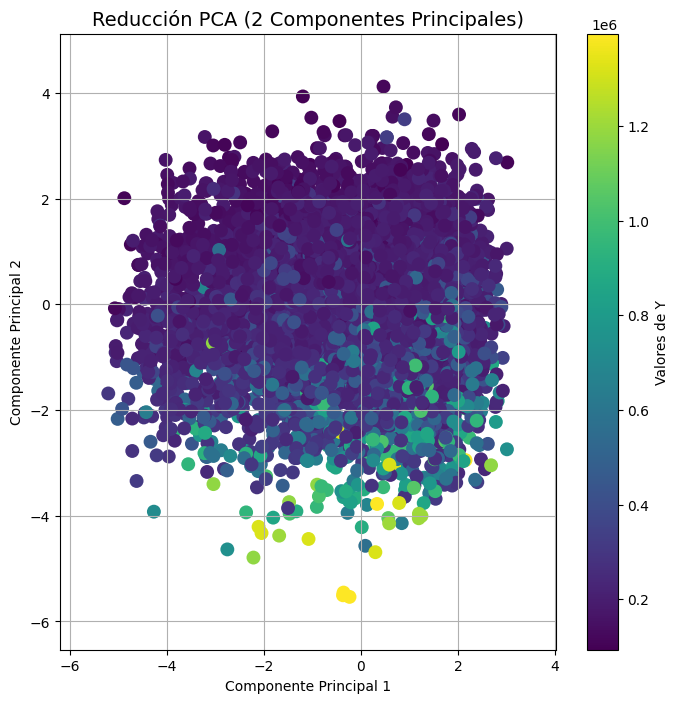

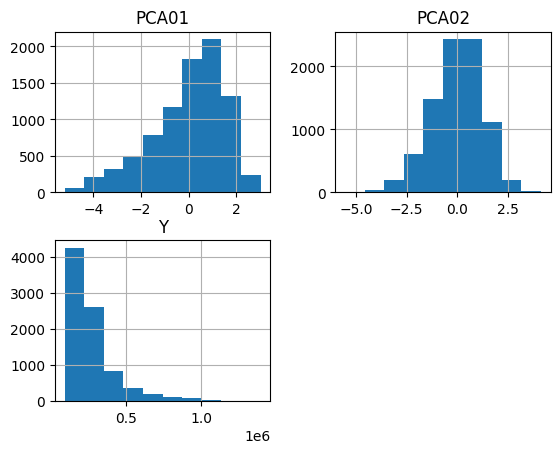

In [66]:
viz = dfFinal[['PCA01','PCA02','Y']]
viz.hist()
plt.show()

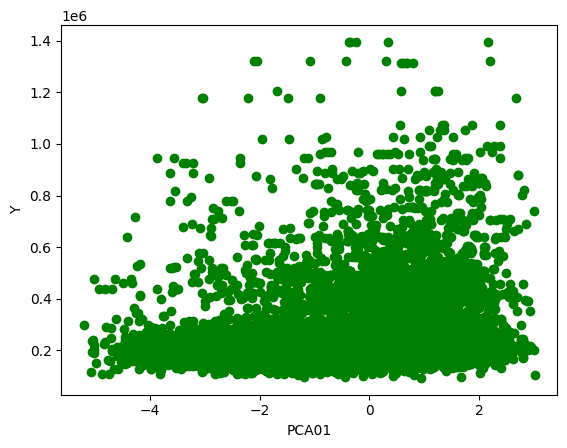

In [67]:
plt.scatter(dfFinal.PCA01, dfFinal.Y, color="green") 
plt.xlabel("PCA01")  
plt.ylabel("Y")  
plt.show()

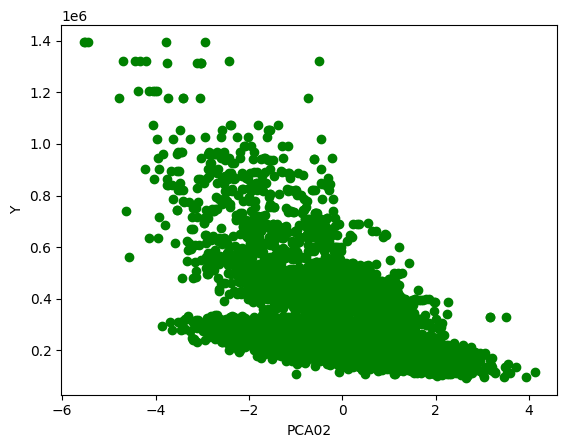

In [68]:
plt.scatter(dfFinal.PCA02, dfFinal.Y,  color='green')
plt.xlabel("PCA02")
plt.ylabel("Y")
plt.show()

<h3 style="color:#ffdd8c "> Regresion lineal </h3>

In [69]:
msk = np .random.rand(len(dfFinal)) < 0.8
train = dfFinal[msk]
test = dfFinal[~msk]

In [70]:
train.head(5)

,PCA01,PCA02,Y
0,1.001233,-2.270489,523745.4442
1,0.828607,-0.615034,217000.5030
2,1.348428,-1.744369,217008.5230
3,1.087298,-1.600413,447803.6350
4,2.775696,-1.941649,235974.6570


In [71]:
test.head(5)

,PCA01,PCA02,Y
5,1.910653,0.189830,199975.7360
8,2.317873,-0.568145,703837.3784
12,-0.117220,-3.670329,897031.4660
13,0.688996,-0.507215,432823.1201
14,1.627848,-1.867975,256663.4490


In [72]:
regr = linear_model.LinearRegression()
train_x = np.asanyarray(train[['PCA02']])
train_y = np.asanyarray(train[['Y']])
regr.fit(train_x, train_y)
print ('Coefficients: ', regr.coef_)
print ('Intercept: ',regr.intercept_)

Coefficients:  [[-69114.23837235]]
Intercept:  [279092.09219648]


In [73]:
test_x = np.asanyarray(test[['PCA02']])
test_y = np.asanyarray(test[['Y']])
test_y_ = regr.predict(test_x)

print('Error Residual Medio (RSE): %.2f' % np.mean((test_y - test_y_)**2))
print('Confianza: %.2f' % regr.score(test_x, test_y))

Error Residual Medio (RSE): 20004660919.25
Confianza: 0.32


In [74]:
plt.scatter(train.PCA02, train.Y,  color='green')
plt.plot(train_x, regr.coef_[0][0]*train_x + regr.intercept_[0], '-r')
plt.xlabel("PCA02")
plt.ylabel("Y")

Text(0, 0.5, 'Y')

In [75]:
dfS = pd.DataFrame({'Actual': test_y.flatten(), 'Predicted': test_y_.flatten()})
dfS.head(10)

,Actual,Predicted
0,199975.7360,265972.104903
1,703837.3784,318358.972831
2,897031.4660,532764.091154
3,432823.1201,314147.837318
4,256663.4490,408195.787460
5,264772.4260,433273.208204
6,231556.4670,335736.970328
7,242354.8690,343464.820733
8,992645.1366,424874.551178
9,283007.6870,395451.615975


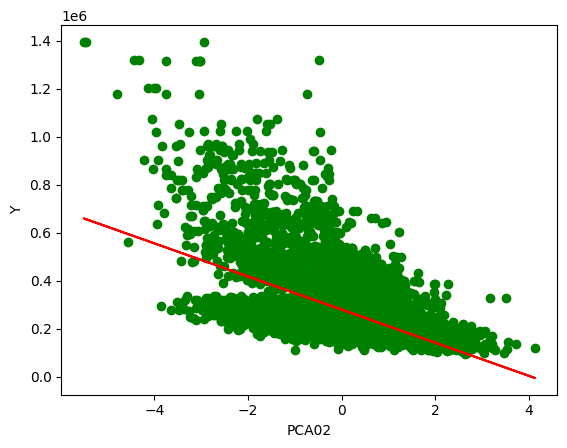

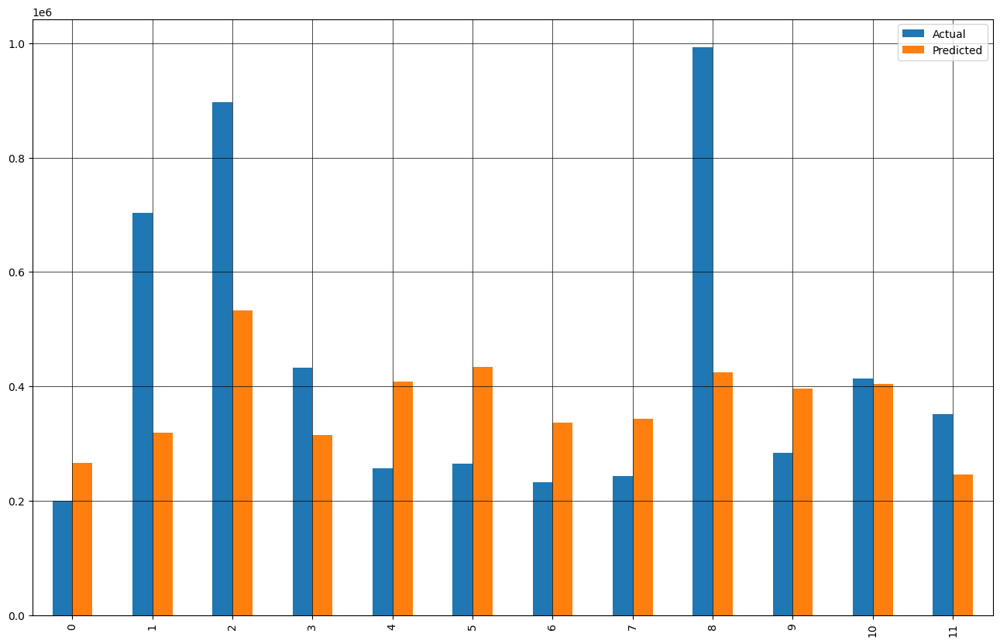

In [76]:
df1 = dfS.head(12)
df1.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='black')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()